<a href="https://colab.research.google.com/github/sajith-91/MACHINE-LEARNING-MODELS/blob/main/NETFLIX_TV_SHOWS_AND_MOVIES_CLUSTERING.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# **Project Name**    - NETFLIX TV SHOWS AND MOVIES CLUSTERING



##### **Project Type**    - Unsupervised


##### **Contribution**    - Individual
##### **Team Member 1 -**SAJITH VARGHESE

# **Project Summary -**

THIS DATA CONTAINS SHOW ID,TYPE OF THE SHOW,TITLE OF THE SHOW,DIRECTOR,CAST,COUNTRY,DATA ADDED,RELEASE YEAR,RATING,DURATION,GENRE OF THE SHOW,DECRIPTION ABOUT THE SHOW.

# **GitHub Link -**

Provide your GitHub Link here.

# **Problem Statement**


**1)EXPLORATORY DATA ANALYSIS**
**2)UNDERSTANDING WHAT TYPE CONTENT IS AVAILABLE IN DIFFERENT COUNTRIES**
**3)IF NETFLIX HAS INCREASINGLY FOCUS ON TV RATHER THAN MOVIES IN RECENT YEARS**
**4)CLUSTERING SIMILAR CONTENT BY MATCHING TEXT-BASED FEATURES**


# **General Guidelines** : -  

1.   Well-structured, formatted, and commented code is required. 
2.   Exception Handling, Production Grade Code & Deployment Ready Code will be a plus. Those students will be awarded some additional credits. 
     
     The additional credits will have advantages over other students during Star Student selection.
       
             [ Note: - Deployment Ready Code is defined as, the whole .ipynb notebook should be executable in one go
                       without a single error logged. ]

3.   Each and every logic should have proper comments.
4. You may add as many number of charts you want. Make Sure for each and every chart the following format should be answered.
        

```
# Chart visualization code
```
            

*   Why did you pick the specific chart?
*   What is/are the insight(s) found from the chart?
* Will the gained insights help creating a positive business impact? 
Are there any insights that lead to negative growth? Justify with specific reason.

5. You have to create at least 15 logical & meaningful charts having important insights.


[ Hints : - Do the Vizualization in  a structured way while following "UBM" Rule. 

U - Univariate Analysis,

B - Bivariate Analysis (Numerical - Categorical, Numerical - Numerical, Categorical - Categorical)

M - Multivariate Analysis
 ]





6. You may add more ml algorithms for model creation. Make sure for each and every algorithm, the following format should be answered.


*   Explain the ML Model used and it's performance using Evaluation metric Score Chart.


*   Cross- Validation & Hyperparameter Tuning

*   Have you seen any improvement? Note down the improvement with updates Evaluation metric Score Chart.

*   Explain each evaluation metric's indication towards business and the business impact pf the ML model used.




















# ***Let's Begin !***

## ***1. Know Your Data***

### Import Libraries

In [1]:
# Import Libraries
import pandas as pd
import numpy as np
from matplotlib import pyplot as plt
from sklearn import preprocessing
from sklearn.feature_extraction.text import CountVectorizer, TfidfVectorizer
from sklearn.model_selection import train_test_split, KFold
from nltk.corpus import stopwords
from nltk.stem.snowball import SnowballStemmer
import matplotlib
# import seaborn as sns
%matplotlib inline
%config InlineBackend.figure_format = 'retina'

In [2]:
import re, string, unicodedata
import nltk
import inflect
from bs4 import BeautifulSoup
from nltk import word_tokenize, sent_tokenize
from nltk.stem import LancasterStemmer, WordNetLemmatizer
from keras.preprocessing.text import Tokenizer

In [3]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


### Dataset Loading

In [4]:
# Load Dataset
df = pd.read_csv('/content/drive/MyDrive/Colab Notebooks/ALMA BETTER/module 4/unsupervised/capstone project/NETFLIX MOVIES AND TV SHOWS CLUSTERING.csv')

### Dataset First View

In [5]:
# Dataset First Look
df.head()

,show_id,type,title,director,cast,country,date_added,release_year,rating,duration,listed_in,description
0,s1,TV Show,3%,NaN,"João Miguel, Bianca Comparato, Michel Gomes, R...",Brazil,"August 14, 2020",2020,TV-MA,4 Seasons,"International TV Shows, TV Dramas, TV Sci-Fi &...",In a future where the elite inhabit an island ...
1,s2,Movie,7:19,Jorge Michel Grau,"Demián Bichir, Héctor Bonilla, Oscar Serrano, ...",Mexico,"December 23, 2016",2016,TV-MA,93 min,"Dramas, International Movies",After a devastating earthquake hits Mexico Cit...
2,s3,Movie,23:59,Gilbert Chan,"Tedd Chan, Stella Chung, Henley Hii, Lawrence ...",Singapore,"December 20, 2018",2011,R,78 min,"Horror Movies, International Movies","When an army recruit is found dead, his fellow..."
3,s4,Movie,9,Shane Acker,"Elijah Wood, John C. Reilly, Jennifer Connelly...",United States,"November 16, 2017",2009,PG-13,80 min,"Action & Adventure, Independent Movies, Sci-Fi...","In a postapocalyptic world, rag-doll robots hi..."
4,s5,Movie,21,Robert Luketic,"Jim Sturgess, Kevin Spacey, Kate Bosworth, Aar...",United States,"January 1, 2020",2008,PG-13,123 min,Dramas,A brilliant group of students become card-coun...


### Dataset Rows & Columns count

In [6]:
# Dataset Rows & Columns count
df.shape

(7787, 12)

### Dataset Information

In [7]:
# Dataset Info
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7787 entries, 0 to 7786
Data columns (total 12 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   show_id       7787 non-null   object
 1   type          7787 non-null   object
 2   title         7787 non-null   object
 3   director      5398 non-null   object
 4   cast          7069 non-null   object
 5   country       7280 non-null   object
 6   date_added    7777 non-null   object
 7   release_year  7787 non-null   int64 
 8   rating        7780 non-null   object
 9   duration      7787 non-null   object
 10  listed_in     7787 non-null   object
 11  description   7787 non-null   object
dtypes: int64(1), object(11)
memory usage: 730.2+ KB


#### Duplicate Values

In [8]:
# Dataset Duplicate Value Count
df[~df.duplicated()].shape

(7787, 12)

no duplicated present in this dataset.

#### Missing Values/Null Values

In [9]:
# Missing Values/Null Values Count
df.isnull().sum()

show_id            0
type               0
title              0
director        2389
cast             718
country          507
date_added        10
release_year       0
rating             7
duration           0
listed_in          0
description        0
dtype: int64

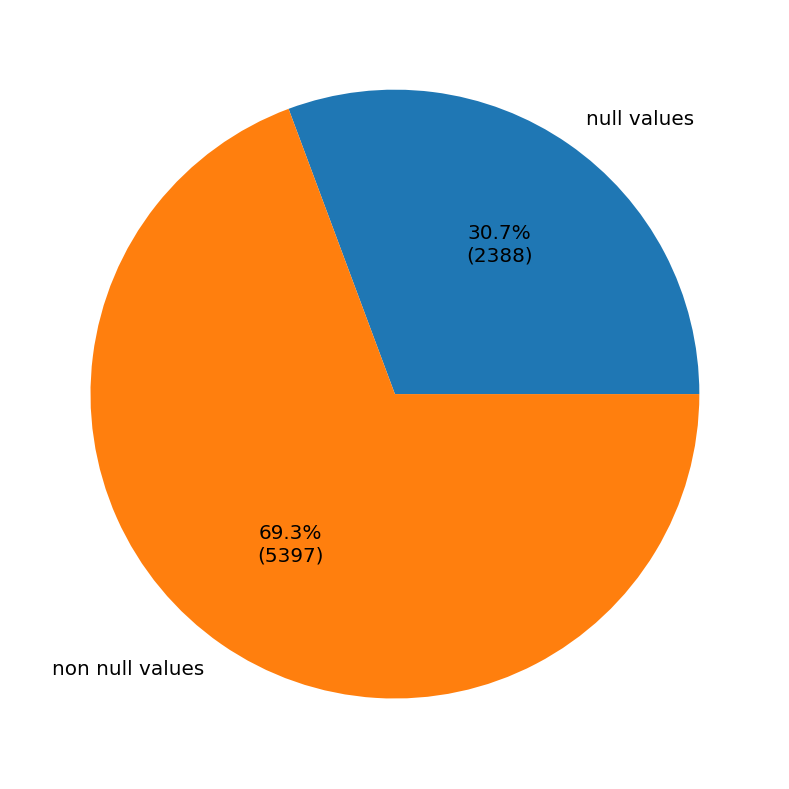

In [10]:
# Visualizing the missing values)
#visualizing the missing values of directors of films
def func(pct,allvalues):
  absolute=int(pct/100*np.sum(allvalues))
  return "{:.1f}%\n({:d})".format(pct,absolute)
data=[(df['director'].isnull().sum()),(len(df['director'])-df['director'].isnull().sum())]
labels=["null values","non null values"]
fig=plt.figure(figsize=(10,7))
plt.pie(data,labels=labels,autopct=lambda pct:func(pct,data))
plt.show()

approximately 30.7% values are missing in director column.so we will avoid this feature for clustering analysis



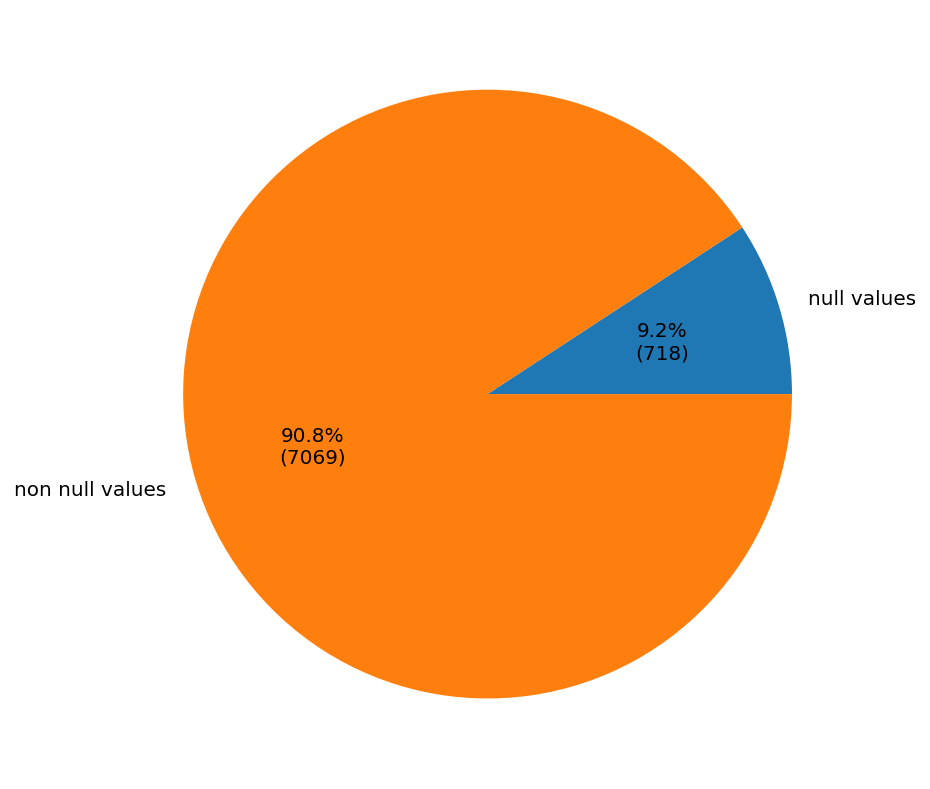

In [11]:
#visualizing null values in cast column
def func(pct,allvalues):
  absolute=int(pct/100*np.sum(allvalues))
  return "{:.1f}%\n({:d})".format(pct,absolute)
data=[(df['cast'].isnull().sum()),(len(df['cast'])-df['cast'].isnull().sum())]
labels=["null values","non null values"]
fig=plt.figure(figsize=(10,7))
plt.pie(data,labels=labels,autopct=lambda pct:func(pct,data))
plt.show()

chart shows that the approximately 10% values are null in this feature

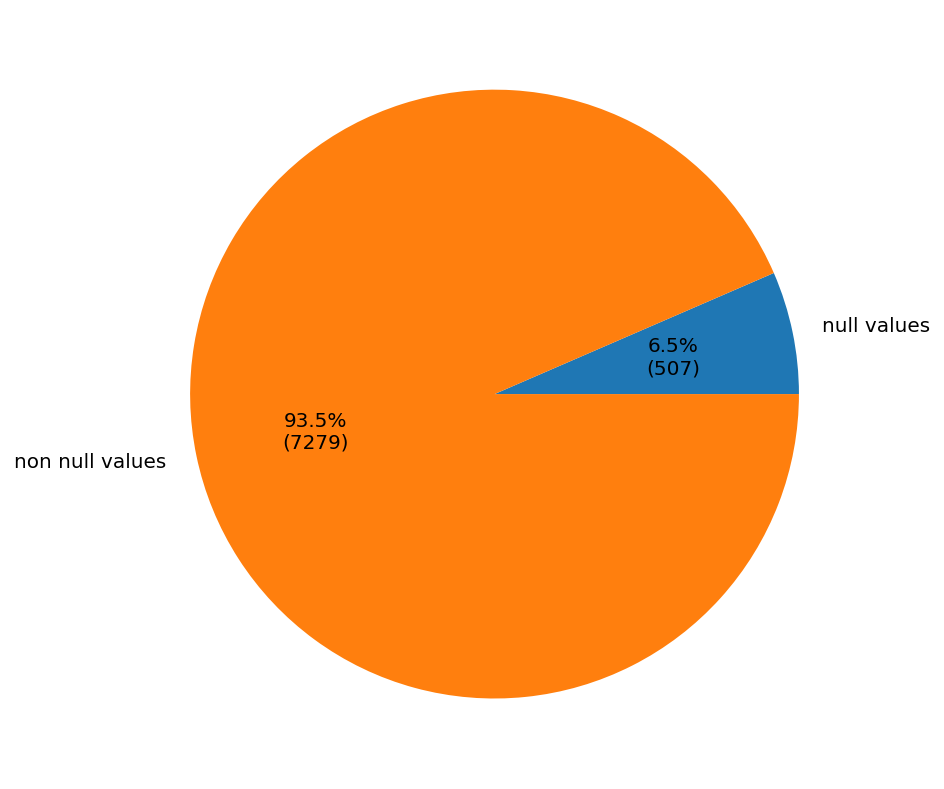

In [12]:
#visualizing null values in country column
def func(pct,allvalues):
  absolute=int(pct/100*np.sum(allvalues))
  return "{:.1f}%\n({:d})".format(pct,absolute)
data=[(df['country'].isnull().sum()),(len(df['country'])-df['country'].isnull().sum())]
labels=["null values","non null values"]
fig=plt.figure(figsize=(10,7))
plt.pie(data,labels=labels,autopct=lambda pct:func(pct,data))
plt.show()

this feature contains only 6.5% null values.so we can drop this null values for clustering

### What did you know about your dataset?

Answer Here

## ***2. Understanding Your Variables***

In [13]:
# Dataset Columns
df.columns

Index(['show_id', 'type', 'title', 'director', 'cast', 'country', 'date_added',
       'release_year', 'rating', 'duration', 'listed_in', 'description'],
      dtype='object')

In [14]:
df.describe(include="all")

,show_id,type,title,director,cast,country,date_added,release_year,rating,duration,listed_in,description
count,7787,7787,7787,5398,7069,7280,7777,7787.000000,7780,7787,7787,7787
unique,7787,2,7787,4049,6831,681,1565,NaN,14,216,492,7769
top,s1,Movie,3%,"Raúl Campos, Jan Suter",David Attenborough,United States,"January 1, 2020",NaN,TV-MA,1 Season,Documentaries,Multiple women report their husbands as missin...
freq,1,5377,1,18,18,2555,118,NaN,2863,1608,334,3
mean,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2013.932580,NaN,NaN,NaN,NaN
std,NaN,NaN,NaN,NaN,NaN,NaN,NaN,8.757395,NaN,NaN,NaN,NaN
min,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1925.000000,NaN,NaN,NaN,NaN
25%,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2013.000000,NaN,NaN,NaN,NaN
50%,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2017.000000,NaN,NaN,NaN,NaN
75%,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2018.000000,NaN,NaN,NaN,NaN


In [15]:
df.rating.unique()

array(['TV-MA', 'R', 'PG-13', 'TV-14', 'TV-PG', 'NR', 'TV-G', 'TV-Y', nan,
       'TV-Y7', 'PG', 'G', 'NC-17', 'TV-Y7-FV', 'UR'], dtype=object)

In [16]:
df.columns

Index(['show_id', 'type', 'title', 'director', 'cast', 'country', 'date_added',
       'release_year', 'rating', 'duration', 'listed_in', 'description'],
      dtype='object')

### Variables Description 

here all features except release year are categorical columns.director columns contains 30.7% null values.similarly,cast column contains null values .so we will drop this columns for the project except analysis for these columns.but country and  rating columns contains very small number of null values,so we will drop null values rows from this data. 

### Check Unique Values for each variable.

In [17]:
# Check Unique Values for each variable.
df.columns

Index(['show_id', 'type', 'title', 'director', 'cast', 'country', 'date_added',
       'release_year', 'rating', 'duration', 'listed_in', 'description'],
      dtype='object')

In [18]:
df.show_id.unique()

array(['s1', 's2', 's3', ..., 's7785', 's7786', 's7787'], dtype=object)

In [19]:
df.title.unique()

array(['3%', '7:19', '23:59', ..., 'Zulu Man in Japan',
       "Zumbo's Just Desserts", "ZZ TOP: THAT LITTLE OL' BAND FROM TEXAS"],
      dtype=object)

In [20]:
df.type.unique()

array(['TV Show', 'Movie'], dtype=object)

In [21]:
df.director.unique()

array([nan, 'Jorge Michel Grau', 'Gilbert Chan', ..., 'Josef Fares',
       'Mozez Singh', 'Sam Dunn'], dtype=object)

In [22]:
df.cast.unique()

array(['João Miguel, Bianca Comparato, Michel Gomes, Rodolfo Valente, Vaneza Oliveira, Rafael Lozano, Viviane Porto, Mel Fronckowiak, Sergio Mamberti, Zezé Motta, Celso Frateschi',
       'Demián Bichir, Héctor Bonilla, Oscar Serrano, Azalia Ortiz, Octavio Michel, Carmen Beato',
       'Tedd Chan, Stella Chung, Henley Hii, Lawrence Koh, Tommy Kuan, Josh Lai, Mark Lee, Susan Leong, Benjamin Lim',
       ...,
       'Vicky Kaushal, Sarah-Jane Dias, Raaghav Chanana, Manish Chaudhary, Meghna Malik, Malkeet Rauni, Anita Shabdish, Chittaranjan Tripathy',
       'Nasty C', 'Adriano Zumbo, Rachel Khoo'], dtype=object)

In [23]:
df.country.unique()

array(['Brazil', 'Mexico', 'Singapore', 'United States', 'Turkey',
       'Egypt', 'India', 'Poland, United States', 'Thailand', 'Nigeria',
       nan, 'Norway, Iceland, United States', 'United Kingdom', 'Japan',
       'South Korea', 'Italy', 'Canada', 'Indonesia', 'Romania', 'Spain',
       'Iceland', 'South Africa, Nigeria', 'France',
       'United States, South Africa', 'Portugal, Spain',
       'Hong Kong, China, Singapore', 'United States, Germany',
       'South Africa, China, United States', 'Argentina',
       'United States, France, Serbia', 'Germany',
       'Denmark, France, Poland', 'Poland', 'Kenya',
       'New Zealand, United Kingdom', 'Pakistan', 'Australia',
       'Australia, United States', 'Mexico, United States',
       'United States, China', 'China, Hong Kong', 'Taiwan',
       'United States, United Kingdom', 'France, South Korea, Japan',
       'United States, Canada', 'United Kingdom, United States',
       'Netherlands, Denmark, South Africa', 'Canada, Unit

In [24]:
df.date_added.unique()

array(['August 14, 2020', 'December 23, 2016', 'December 20, 2018', ...,
       'December 6, 2018', 'March 9, 2016', 'January 11, 2020'],
      dtype=object)

In [25]:
df.release_year.unique()

array([2020, 2016, 2011, 2009, 2008, 2019, 1997, 2017, 2018, 2014, 2015,
       2010, 2005, 2013, 2012, 2006, 2000, 2003, 1989, 2004, 1977, 1971,
       1993, 2007, 1998, 1988, 1996, 2002, 1986, 1990, 1979, 1980, 1974,
       2001, 1999, 1966, 1991, 1982, 1994, 1995, 1978, 1992, 1972, 1975,
       2021, 1973, 1967, 1960, 1981, 1958, 1976, 1968, 1956, 1985, 1965,
       1984, 1983, 1987, 1945, 1946, 1962, 1925, 1942, 1969, 1955, 1963,
       1964, 1954, 1970, 1944, 1947, 1959, 1943])

In [26]:
df.rating.unique()

array(['TV-MA', 'R', 'PG-13', 'TV-14', 'TV-PG', 'NR', 'TV-G', 'TV-Y', nan,
       'TV-Y7', 'PG', 'G', 'NC-17', 'TV-Y7-FV', 'UR'], dtype=object)

In [27]:
df.duration.unique()

array(['4 Seasons', '93 min', '78 min', '80 min', '123 min', '1 Season',
       '95 min', '119 min', '118 min', '143 min', '103 min', '89 min',
       '91 min', '149 min', '144 min', '124 min', '87 min', '110 min',
       '128 min', '117 min', '100 min', '2 Seasons', '84 min', '99 min',
       '90 min', '102 min', '104 min', '105 min', '56 min', '125 min',
       '81 min', '97 min', '106 min', '107 min', '109 min', '44 min',
       '75 min', '101 min', '3 Seasons', '37 min', '113 min', '114 min',
       '130 min', '94 min', '140 min', '135 min', '82 min', '70 min',
       '121 min', '92 min', '164 min', '53 min', '83 min', '116 min',
       '86 min', '120 min', '96 min', '126 min', '129 min', '77 min',
       '137 min', '148 min', '28 min', '122 min', '176 min', '85 min',
       '22 min', '68 min', '111 min', '29 min', '142 min', '168 min',
       '21 min', '59 min', '20 min', '98 min', '108 min', '76 min',
       '26 min', '156 min', '30 min', '57 min', '150 min', '133 min',
       '1

In [28]:
df.listed_in.unique()

array(['International TV Shows, TV Dramas, TV Sci-Fi & Fantasy',
       'Dramas, International Movies',
       'Horror Movies, International Movies',
       'Action & Adventure, Independent Movies, Sci-Fi & Fantasy',
       'Dramas', 'International TV Shows, TV Dramas, TV Mysteries',
       'Horror Movies, International Movies, Thrillers',
       'Dramas, Thrillers',
       'Crime TV Shows, International TV Shows, TV Dramas',
       'Crime TV Shows, Docuseries, International TV Shows',
       'Documentaries, International Movies, Sports Movies',
       'Independent Movies, Sci-Fi & Fantasy, Thrillers',
       'Dramas, International Movies, Thrillers',
       'International TV Shows, TV Dramas',
       'Comedies, Dramas, Independent Movies', 'Sports Movies',
       'Dramas, Independent Movies, International Movies',
       'Action & Adventure, Dramas, International Movies',
       'Anime Series, International TV Shows', 'Documentaries',
       'Reality TV', 'Documentaries, International

In [29]:
df.description.unique()

array(['In a future where the elite inhabit an island paradise far from the crowded slums, you get one chance to join the 3% saved from squalor.',
       'After a devastating earthquake hits Mexico City, trapped survivors from all walks of life wait to be rescued while trying desperately to stay alive.',
       "When an army recruit is found dead, his fellow soldiers are forced to confront a terrifying secret that's haunting their jungle island training camp.",
       ...,
       "In this documentary, South African rapper Nasty C hits the stage and streets of Tokyo, introducing himself to the city's sights, sounds and culture.",
       'Dessert wizard Adriano Zumbo looks for the next “Willy Wonka” in this tense competition that finds skilled amateurs competing for a $100,000 prize.',
       'This documentary delves into the mystique behind the blues-rock trio and explores how the enigmatic band created their iconic look and sound.'],
      dtype=object)

In [30]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7787 entries, 0 to 7786
Data columns (total 12 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   show_id       7787 non-null   object
 1   type          7787 non-null   object
 2   title         7787 non-null   object
 3   director      5398 non-null   object
 4   cast          7069 non-null   object
 5   country       7280 non-null   object
 6   date_added    7777 non-null   object
 7   release_year  7787 non-null   int64 
 8   rating        7780 non-null   object
 9   duration      7787 non-null   object
 10  listed_in     7787 non-null   object
 11  description   7787 non-null   object
dtypes: int64(1), object(11)
memory usage: 730.2+ KB


## 3. ***Data Wrangling***

### Data Wrangling Code

In [31]:
# Write your code to make your dataset analysis ready.
#removed rows which have null values in country column
df1=df[~df['rating'].isnull()]

In [32]:
#removed rows which have null values in rating column
df2=df1[~df1['country'].isnull()]

In [33]:
df2.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 7274 entries, 0 to 7786
Data columns (total 12 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   show_id       7274 non-null   object
 1   type          7274 non-null   object
 2   title         7274 non-null   object
 3   director      5189 non-null   object
 4   cast          6652 non-null   object
 5   country       7274 non-null   object
 6   date_added    7265 non-null   object
 7   release_year  7274 non-null   int64 
 8   rating        7274 non-null   object
 9   duration      7274 non-null   object
 10  listed_in     7274 non-null   object
 11  description   7274 non-null   object
dtypes: int64(1), object(11)
memory usage: 738.8+ KB


### What all manipulations have you done and insights you found?

for the project,we have removed the null values rows in the columns "rating" and "country".which have very few number of null values present.dropping this rows will not affect the project.

## ***4. Data Vizualization, Storytelling & Experimenting with charts : Understand the relationships between variables***

#### Chart - 1

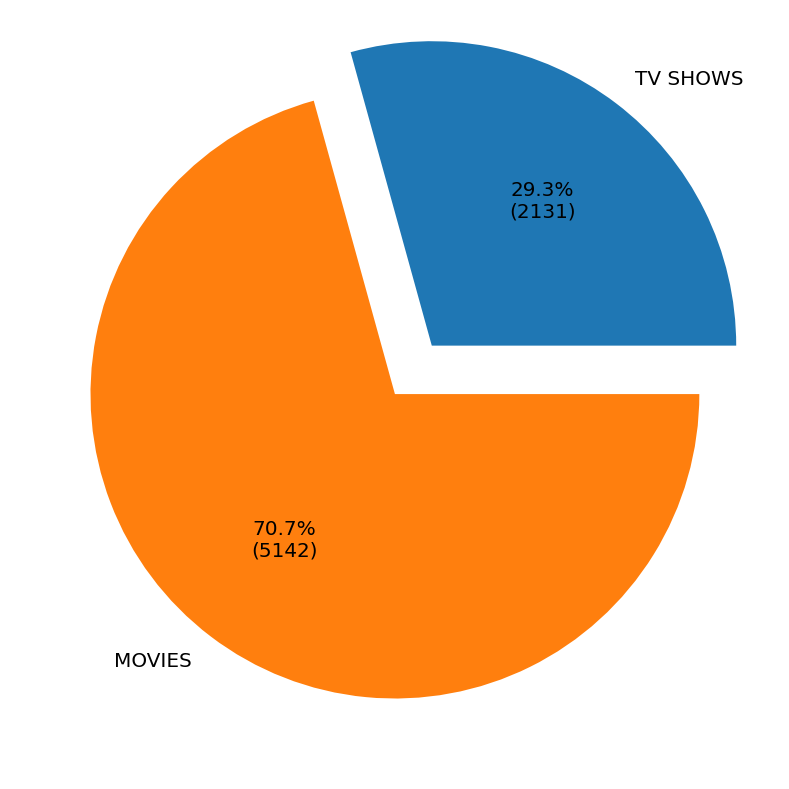

In [35]:
# Chart - 1 visualization code
#which type released more in netflix
def func(pct,allvalues):
  absolute=int(pct/100*np.sum(allvalues))
  return "{:.1f}%\n({:d})".format(pct,absolute)
data=[df2[df2["type"]=="TV Show"]["type"].value_counts().sum(),df2[df2["type"]=="Movie"]["type"].value_counts().sum()]
labels=["TV SHOWS","MOVIES"]
fig=plt.figure(figsize=(10,7))
plt.pie(data,labels=labels,autopct=lambda pct:func(pct,data),explode=[0.2,0])
plt.show()


from this pie chart , we can conclude that netflix is released more movies rather than tv shows. but this is overall conclusion,so we can use this chart to next analysis on the basis of years. then we can check the trend.

##### 1. Why did you pick the specific chart?

this chart shows the difference of shows released so far.

##### 2. What is/are the insight(s) found from the chart?

from this pie chart , we can conclude that netflix is released more movies rather than tv shows. but this is overall conclusion,so we can use this chart to next analysis on the basis of years. then we can check the trend.

##### 3. Will the gained insights help creating a positive business impact? 
Are there any insights that lead to negative growth? Justify with specific reason.

Answer Here

#### Chart - 2

In [36]:
# Chart - 2 visualization code


In [37]:
x_years=[i for i in range(2011,2021)]


In [38]:
tv_show=[]
movie=[]
for i in x_years:
  for j in ("TV Show","Movie"):
    j_i=df2.loc[(df2["release_year"]==i) & (df2["type"]==j)]["type"].value_counts().sum()
    
    if j=="TV Show":
      tv_show.append(j_i)
    if j=="Movie":
      movie.append(j_i)


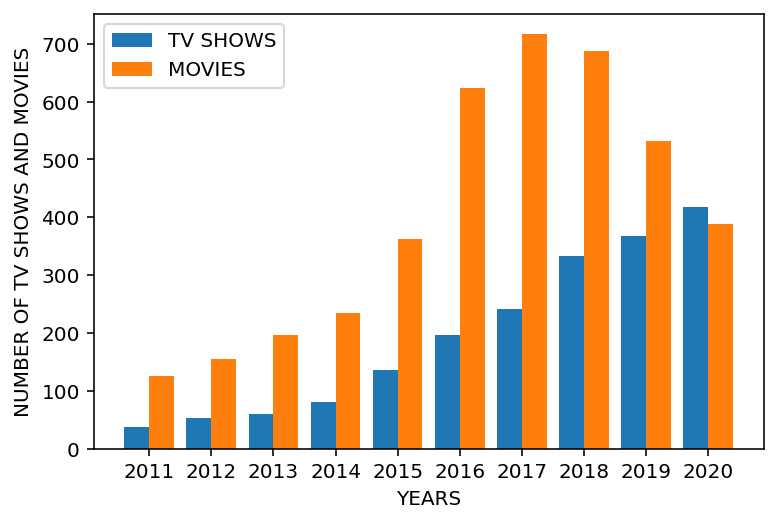

In [39]:
x_axis=np.arange(len(x_years))
plt.bar(x_axis-0.2,tv_show,0.4,label="TV SHOWS")
plt.bar(x_axis+0.2,movie,0.4,label="MOVIES")
plt.xticks(x_axis,x_years)
plt.xlabel("YEARS")
plt.ylabel("NUMBER OF TV SHOWS AND MOVIES")
plt.legend()
plt.show()

##### 1. Why did you pick the specific chart?

this chart shows,how tv shows and movies released in last 10 years

##### 2. What is/are the insight(s) found from the chart?

from this chart it is clear that,netflix giving more importance to tv shows rather than movies.in 2020,number of tv shows released overcome the movies.

##### 3. Will the gained insights help creating a positive business impact? 
Are there any insights that lead to negative growth? Justify with specific reason.

it is clear that the netflix giving more importance to tv shows.it means more viwers interested in tv shows rather than netflix

#### Chart - 3

<ipython-input-41-f335d68f8842>:4: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  df_tv_show=df2[df["type"]=="TV Show"]


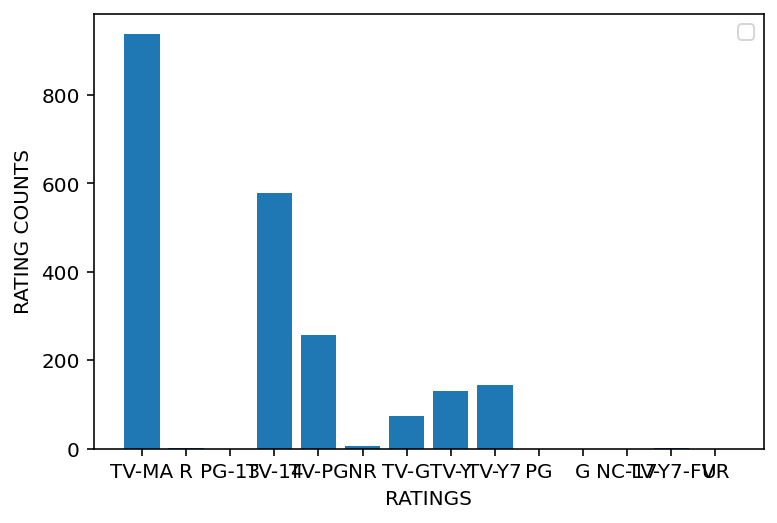

In [41]:
# Chart - 3 visualization code
#finding most numbers of types of tv shows and movies released beased on rating
different_ratings=df2.rating.unique()
df_tv_show=df2[df["type"]=="TV Show"]
tv_count=[]
for i in different_ratings:
  tv_showcount=df_tv_show.loc[df_tv_show["rating"]==i]["type"].value_counts().sum()
  tv_count.append(tv_showcount)
x_length=np.arange(len(different_ratings))
plt.bar(x_length,tv_count)
plt.xticks(x_length,different_ratings)
plt.xlabel("RATINGS")
plt.ylabel("RATING COUNTS")
plt.legend()
plt.show()



##### 1. Why did you pick the specific chart?

TO SHOW THE WHICH RATING TV SHOWS ARE MOSTLY RELEASED IN NETFLIX 

##### 2. What is/are the insight(s) found from the chart?

FROM THE SHART WE CAN ANALYSE THAT THE SHOWS CONTAINS MATURED CONTENTS RELEASED IN NETFLIX.SO THE NETFLIX IS MAINLY FOCUS ON ADULT CUSTOMERS.

##### 3. Will the gained insights help creating a positive business impact? 
Are there any insights that lead to negative growth? Justify with specific reason.

IT SHOWS NETFLIX CUSTOMERS ARE MOSTLY ADULTS.

#### Chart - 4

<ipython-input-42-c26dca5201b2>:4: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  df_tv_show=df2[df["type"]=="Movie"]


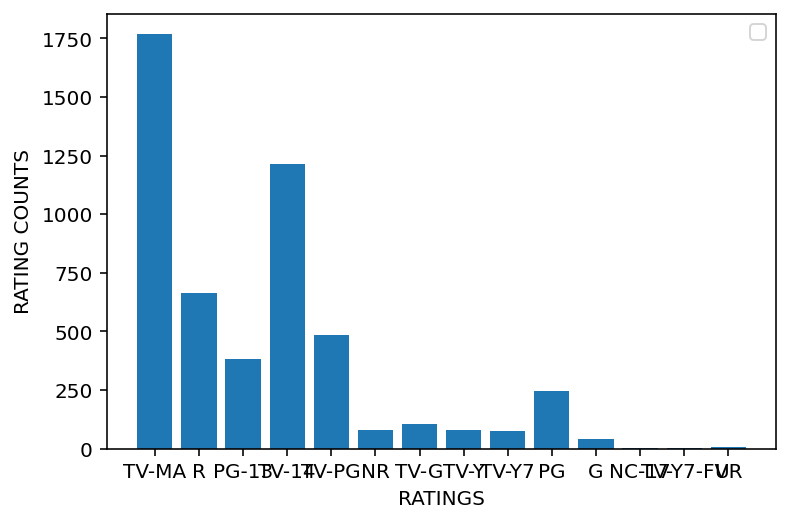

In [42]:
# Chart - 4 visualization code
#finding most numbers of types of tv shows and movies released beased on rating
different_ratings=df2.rating.unique()
df_tv_show=df2[df["type"]=="Movie"]
tv_count=[]
for i in different_ratings:
  tv_showcount=df_tv_show.loc[df_tv_show["rating"]==i]["type"].value_counts().sum()
  tv_count.append(tv_showcount)
x_length=np.arange(len(different_ratings))
plt.bar(x_length,tv_count)
plt.xticks(x_length,different_ratings)
plt.xlabel("RATINGS")
plt.ylabel("RATING COUNTS")
plt.legend()
plt.show()

##### 1. Why did you pick the specific chart?

chart shows that the movies released in contains matured contents

##### 2. What is/are the insight(s) found from the chart?

more number of movies released in netflix contains matured contents.but movies for all ages are also released.

##### 3. Will the gained insights help creating a positive business impact? 
Are there any insights that lead to negative growth? Justify with specific reason.

from the chart we can understand that when releasing movies on netflix,they consider all age.

#### Chart - 5

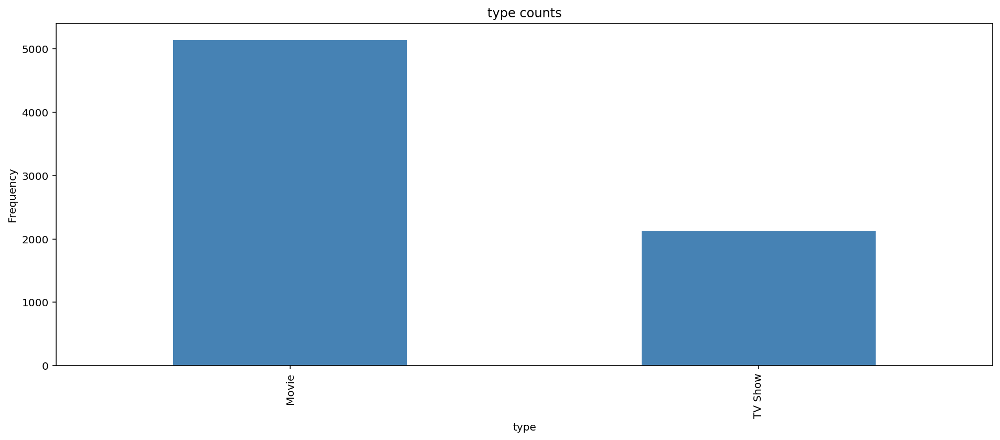

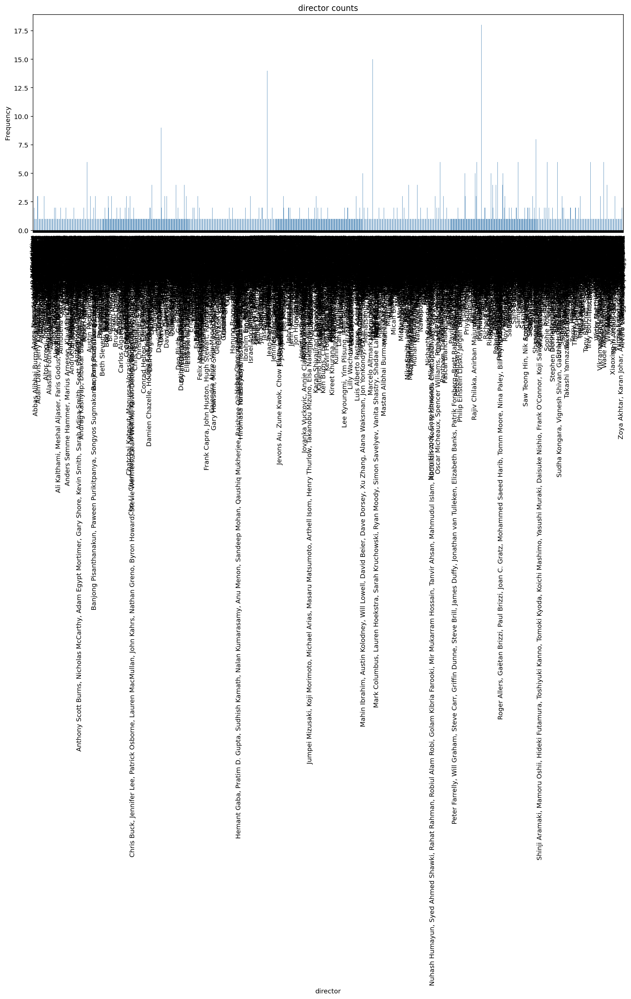

/usr/local/lib/python3.9/dist-packages/IPython/core/pylabtools.py:128: UserWarning: Glyph 3657 (\N{THAI CHARACTER MAI THO}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)
/usr/local/lib/python3.9/dist-packages/IPython/core/pylabtools.py:128: UserWarning: Glyph 12539 (\N{KATAKANA MIDDLE DOT}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)


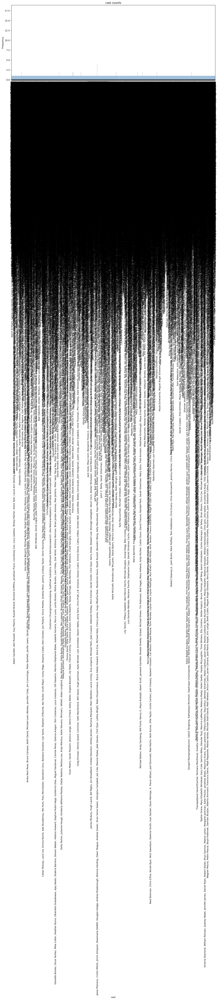

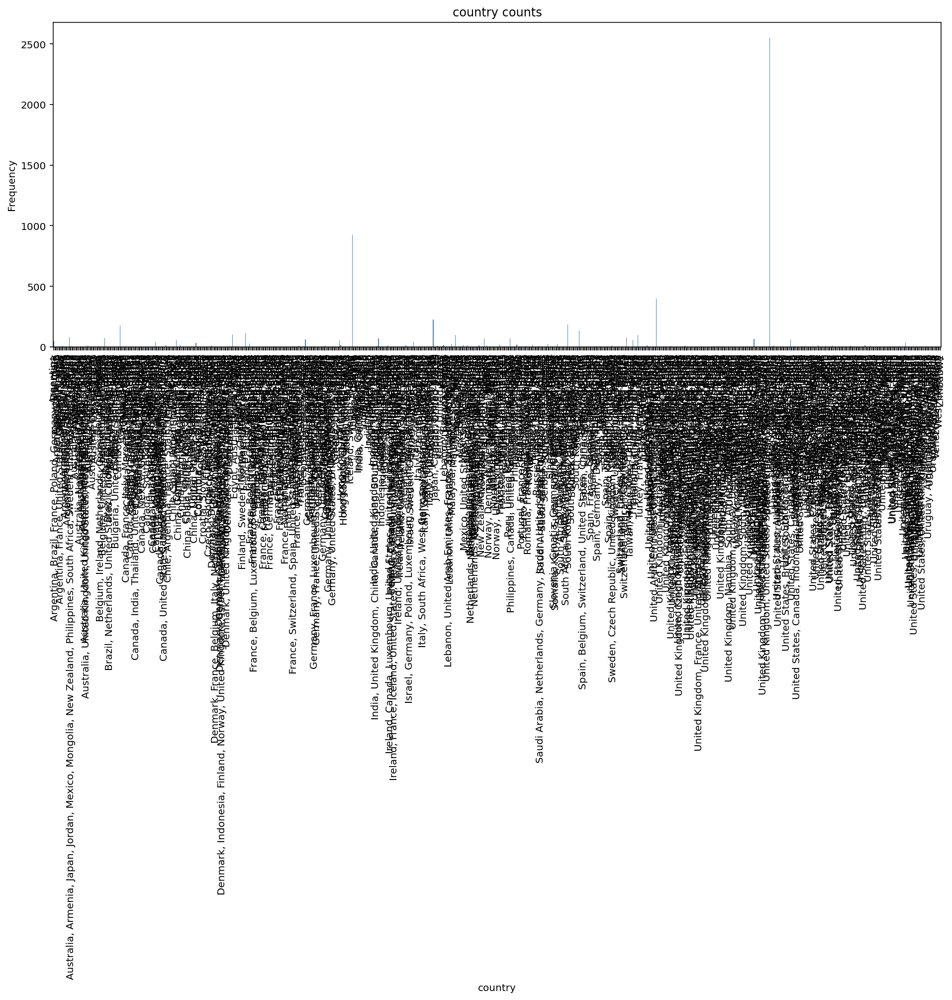

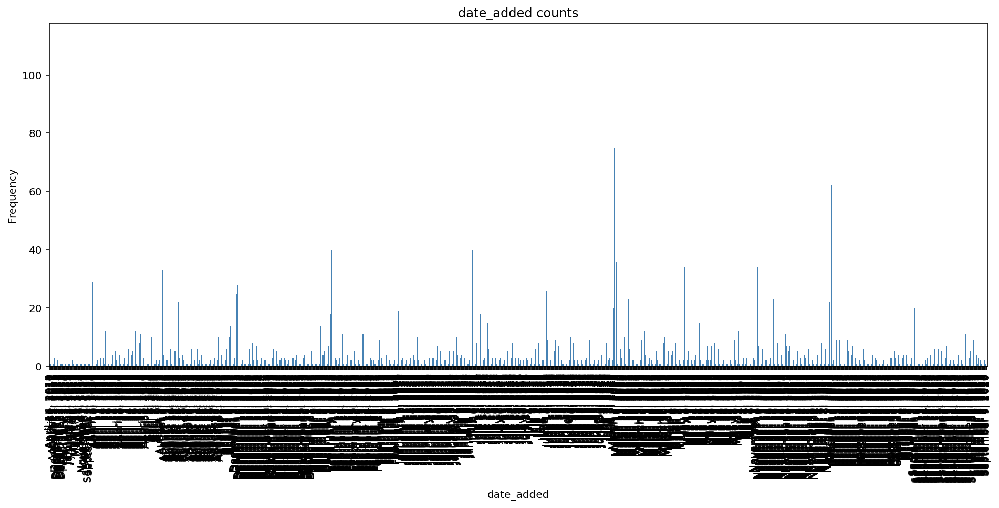

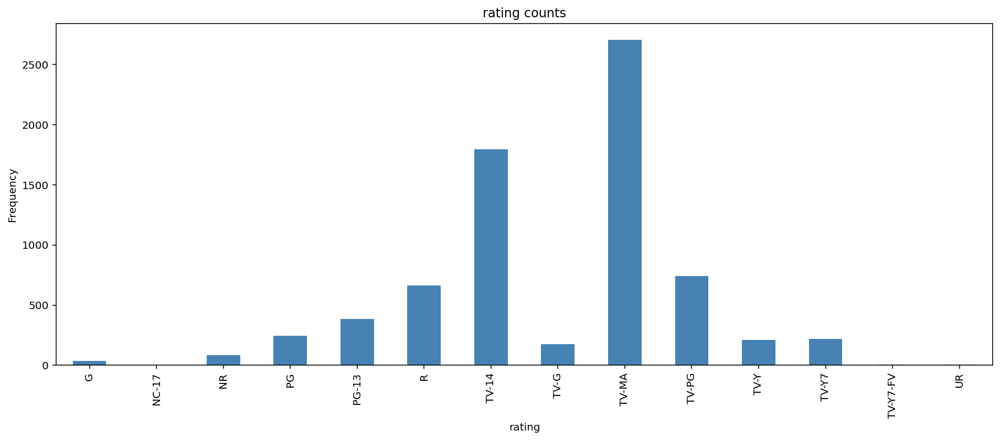

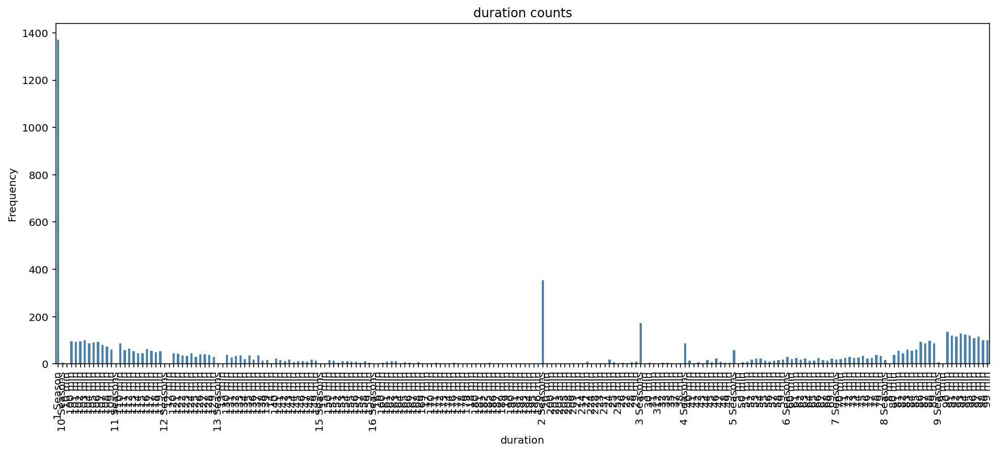

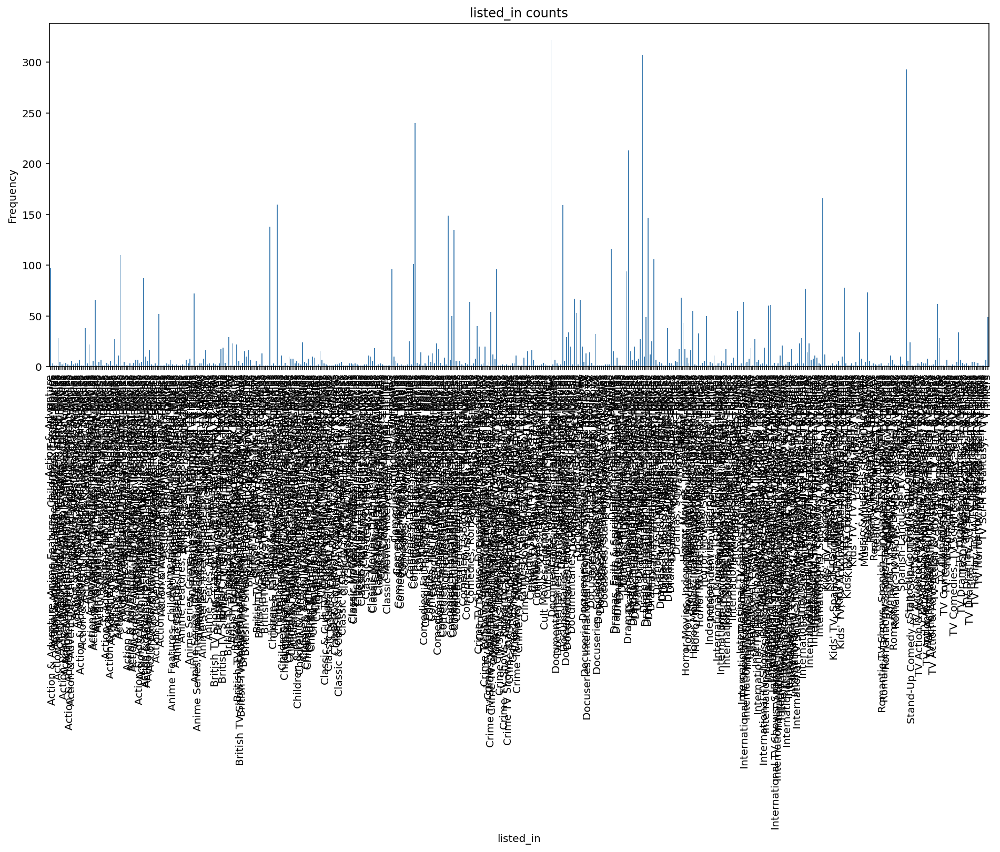

In [43]:
# Chart - 5 visualization code
categorical_features =[i for i in df2.describe(include=['object','category']).columns if i not in ("show_id","title","description")]
for col in categorical_features:
  counts = df2[col].value_counts().sort_index()
  fig = plt.figure(figsize=(16, 6))
  ax = fig.gca()
  counts.plot.bar(ax = ax, color='steelblue')
  ax.set_title(col + ' counts')
  ax.set_xlabel(col) 
  ax.set_ylabel("Frequency")
  plt.show()

"##### 1. Why did you pick the specific chart?

this charts shows counts of each unique categories in each column.

##### 2. What is/are the insight(s) found from the chart?

from the chart we can see most frequent categories in each feature

##### 3. Will the gained insights help creating a positive business impact? 
each charts shows frequency of unique categories in each variable.

this will help to focus on most viewers category

#### Chart - 6

In [44]:
# Chart - 6 visualization code
df2.country.value_counts().head(15)

United States     2552
India              923
United Kingdom     397
Japan              225
South Korea        183
Canada             177
Spain              134
France             115
Egypt              101
Turkey             100
Mexico             100
Australia           82
Taiwan              78
Brazil              72
Philippines         71
Name: country, dtype: int64

In [45]:
countries=[i for i in df2.country.value_counts().head(10).index]
countries

['United States',
 'India',
 'United Kingdom',
 'Japan',
 'South Korea',
 'Canada',
 'Spain',
 'France',
 'Egypt',
 'Turkey']

we want to analyse,contents available in each countries.we use most shows released countries.

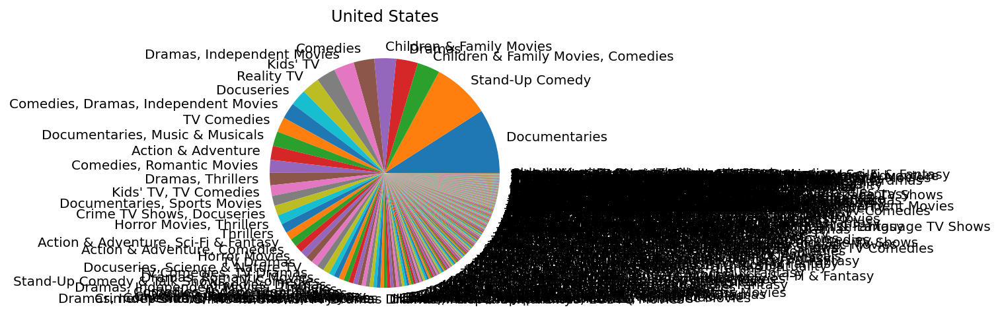

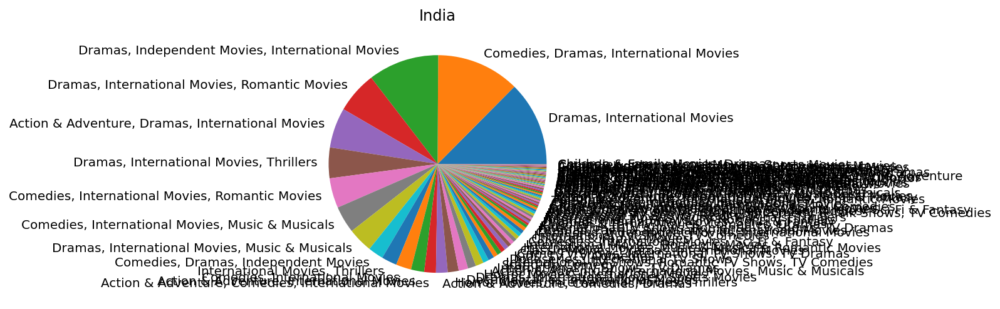

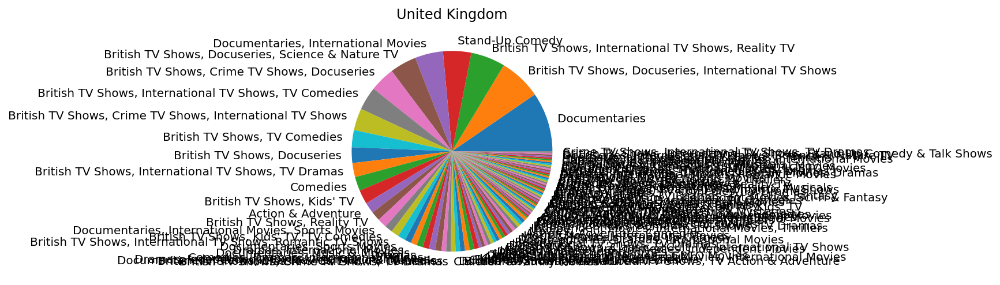

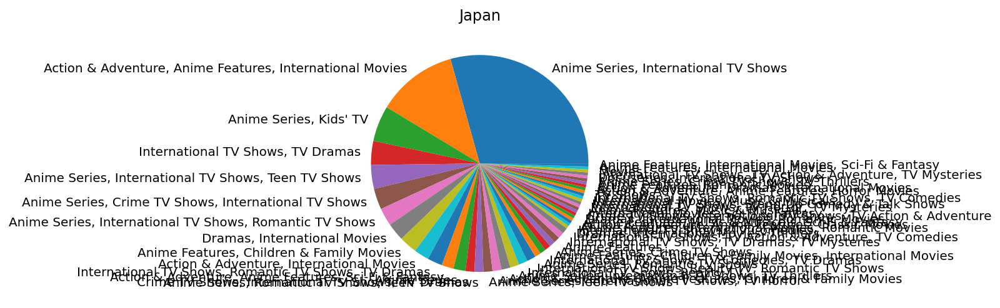

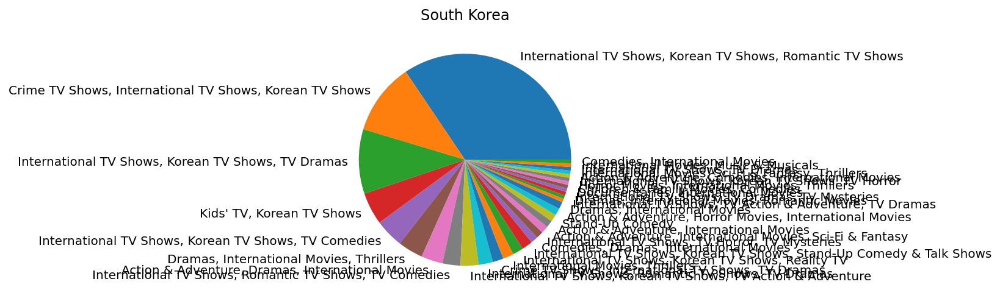

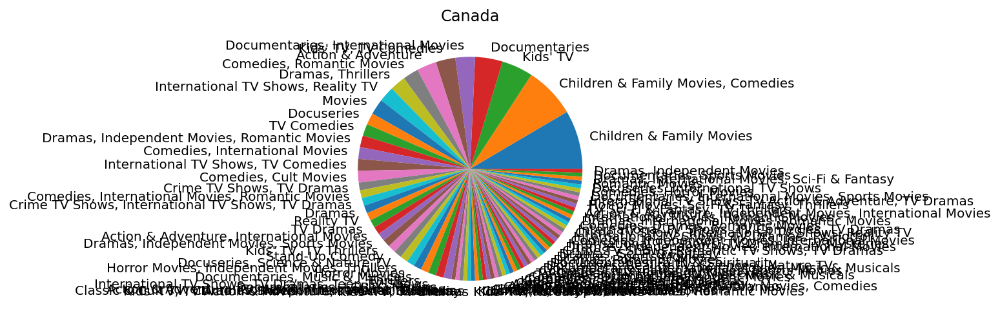

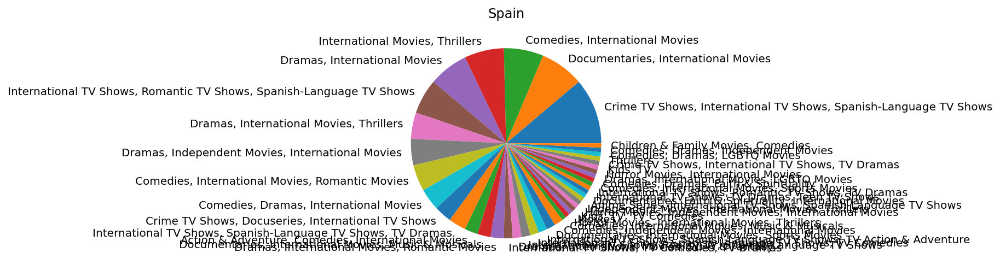

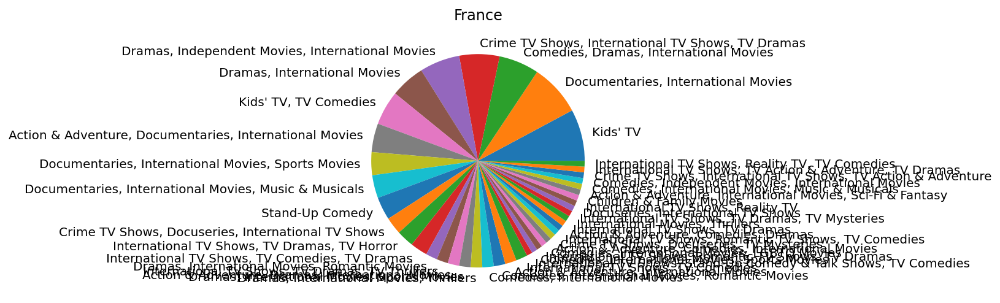

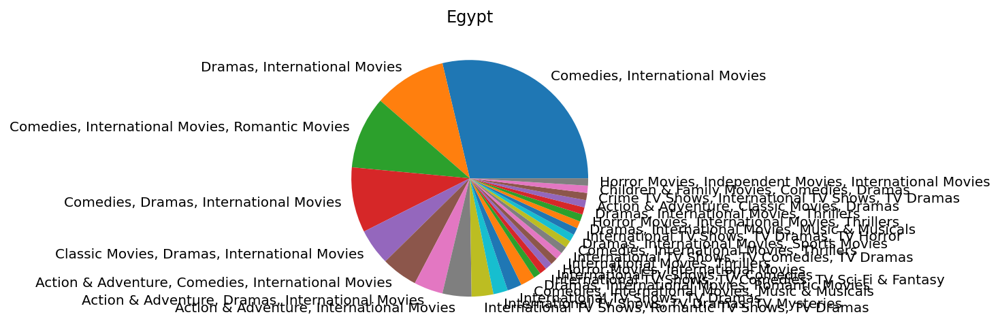

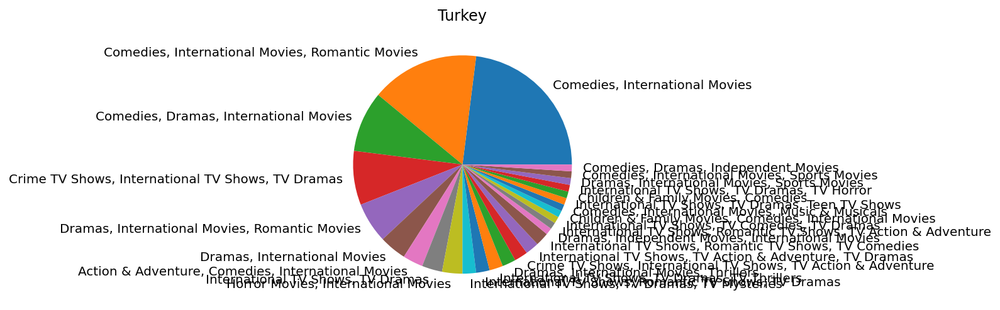

In [46]:
for i in countries:
  country_i=df2[df2["country"]==i]["listed_in"].value_counts()
  plt.pie(country_i,labels=df2[df2["country"]==i]["listed_in"].value_counts().index)
  plt.title(i)
  plt.show()

##### 1. Why did you pick the specific chart?

this chart shows which contents shows are more released in each countries.

##### 2. What is/are the insight(s) found from the chart?

we can see that in unites states documentaries and stand up comedies are more released.in india,dramas,international movies,comedies are more released.similarly we can find which contents have more importance.

##### 3. Will the gained insights help creating a positive business impact? 
Are there any insights that lead to negative growth? Justify with specific reason.

from the chart we can asssume that which contents are more people interested in.we can use this data,and genres when selecting a film netflix.

## ***6. Feature Engineering & Data Pre-processing***

### 1. Handling Missing Values

In [59]:
df2.isnull().sum()

show_id            0
type               0
title              0
director        2085
cast             622
country            0
date_added         9
release_year       0
rating             0
duration           0
listed_in          0
description        0
dtype: int64

#### What all missing value imputation techniques have you used and why did you use those techniques?

here we are using listed in and description column.these columns not contained null values 

### 2. Handling Outliers

In [60]:
# Handling Outliers & Outlier treatments

##### What all outlier treatment techniques have you used and why did you use those techniques?

Answer Here.

### 3. Categorical Encoding

In [61]:
# Encode your categorical columns

#### What all categorical encoding techniques have you used & why did you use those techniques?

Answer Here.

### 4. Textual Data Preprocessing 
(It's mandatory for textual dataset i.e., NLP, Sentiment Analysis, Text Clustering etc.)

#### 1. Lower Casing

In [63]:
# Lower Casing
def to_lowercase(words):
    """Convert all characters to lowercase from list of tokenized words"""
    new_words = []
    for word in words:
        new_word = word.lower()
        new_words.append(new_word)
    return new_words

#### 2. Removing Punctuations

In [64]:
# Remove Punctuations
def remove_punctuation(text):
    '''a function for removing punctuation'''
    import string
    # replacing the punctuations with no space, 
    # which in effect deletes the punctuation marks 
    translator = str.maketrans('', '', string.punctuation)
    # return the text stripped of punctuation marks
    return text.translate(translator)



#### 3. Removing URLs & Removing words and digits contain digits.

In [65]:
# Remove URLs & Remove words and digits contain digits
def remove_non_ascii(words):
    """Remove non-ASCII characters from list of tokenized words"""
    new_words = []
    for word in words:
        new_word = unicodedata.normalize('NFKD', word).encode('ascii', 'ignore').decode('utf-8', 'ignore')
        new_words.append(new_word)
    return new_words

In [66]:
def replace_numbers(words):
    """Replace all interger occurrences in list of tokenized words with textual representation"""
    p = inflect.engine()
    new_words = []
    for word in words:
        if word.isdigit():
            new_word = p.number_to_words(word)
            new_words.append(new_word)
        else:
            new_words.append(word)
    return new_words

#### 4. Removing Stopwords & Removing White spaces

In [67]:
# Remove Stopwords
import nltk
nltk.download('stopwords')

[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Unzipping corpora/stopwords.zip.


True

In [68]:
# extracting the stopwords from nltk library
sw = stopwords.words('english')
# displaying the stopwords
np.array(sw)
def stopwords(text):
    '''a function for removing the stopword'''
    # removing the stop words and lowercasing the selected words
    text = [word.lower() for word in text.split() if word.lower() not in sw]
    # joining the list of words with space separator
    return " ".join(text)

In [69]:
# Remove White spaces

#### 5. Rephrase Text

In [70]:
# Rephrase Text
# create an object of stemming function
stemmer = SnowballStemmer("english")

def stemming(text):    
    '''a function which stems each word in the given text'''
    text = [stemmer.stem(word) for word in text.split()]
    return " ".join(text) 
def lemmatize_verbs(words):
    """Lemmatize verbs in list of tokenized words"""
    lemmatizer = WordNetLemmatizer()
    lemmas = []
    for word in words:
        lemma = lemmatizer.lemmatize(word, pos='v')
        lemmas.append(lemma)
    return lemmas

#### 6. Tokenization

#### 7. Text Normalization

In [71]:
def normalize(words):
  df2['desription'] = df2['description'].apply(to_lowercase)
  df2['desription'] = df2['description'].apply(remove_punctuation)
  df2['desription'] = df2['description'].apply(remove_non_ascii)
  df2['desription'] = df2['description'].apply(replace_numbers)
  df2['desription'] = df2['description'].apply(stopwords)
  df2['desription'] = df2['description'].apply(stemming)
  df2['desription'] = df2['description'].apply(lemmatize_verbs)


**top word after syemming operation**

In [72]:
tfid_vectorizer = TfidfVectorizer()


In [73]:
#collect vocabulary count
# create the object of tfid vectorizer
tfid_vectorizer = TfidfVectorizer()

# fit the vectorizer using the text data
tfid_vectorizer.fit(df2['description'])

# collect the vocabulary items used in the vectorizer
dictionary = tfid_vectorizer.vocabulary_.items()

<Axes: >

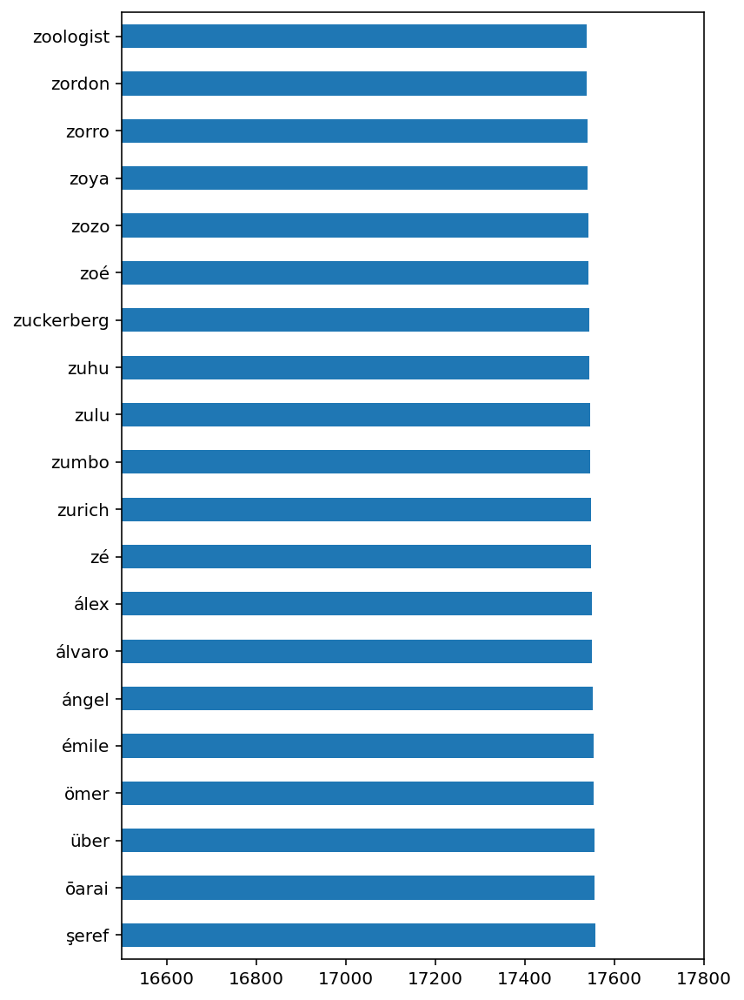

In [74]:
# lists to store the vocab and counts
vocab = []
count = []
# iterate through each vocab and count append the value to designated lists
for key, value in dictionary:
    vocab.append(key)
    count.append(value)
# store the count in panadas dataframe with vocab as index
vocab_after_stem = pd.Series(count, index=vocab)
# sort the dataframe
vocab_after_stem = vocab_after_stem.sort_values(ascending=False)
# plot of the top vocab
top_vacab = vocab_after_stem.head(20)
top_vacab.plot(kind = 'barh', figsize=(6,10), xlim= (16500, 17800))

**histogram of text length of each content



In [75]:
# create an object of stemming function
stemmer = SnowballStemmer("english")

def stemming(text):    
    '''a function which stems each word in the given text'''
    text = [stemmer.stem(word) for word in text.split()]
    return " ".join(text) 


In [76]:
df2['description'] = df2['description'].apply(stopwords)
df2.head(10)

<ipython-input-76-a31521801d90>:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df2['description'] = df2['description'].apply(stopwords)


,show_id,type,title,director,cast,country,date_added,release_year,rating,duration,listed_in,description
0,s1,TV Show,3%,NaN,"João Miguel, Bianca Comparato, Michel Gomes, R...",Brazil,"August 14, 2020",2020,TV-MA,4 Seasons,"International TV Shows, TV Dramas, TV Sci-Fi &...",future elite inhabit island paradise far crowd...
1,s2,Movie,7:19,Jorge Michel Grau,"Demián Bichir, Héctor Bonilla, Oscar Serrano, ...",Mexico,"December 23, 2016",2016,TV-MA,93 min,"Dramas, International Movies","devastating earthquake hits mexico city, trapp..."
2,s3,Movie,23:59,Gilbert Chan,"Tedd Chan, Stella Chung, Henley Hii, Lawrence ...",Singapore,"December 20, 2018",2011,R,78 min,"Horror Movies, International Movies","army recruit found dead, fellow soldiers force..."
3,s4,Movie,9,Shane Acker,"Elijah Wood, John C. Reilly, Jennifer Connelly...",United States,"November 16, 2017",2009,PG-13,80 min,"Action & Adventure, Independent Movies, Sci-Fi...","postapocalyptic world, rag-doll robots hide fe..."
4,s5,Movie,21,Robert Luketic,"Jim Sturgess, Kevin Spacey, Kate Bosworth, Aar...",United States,"January 1, 2020",2008,PG-13,123 min,Dramas,brilliant group students become card-counting ...
5,s6,TV Show,46,Serdar Akar,"Erdal Beşikçioğlu, Yasemin Allen, Melis Birkan...",Turkey,"July 1, 2017",2016,TV-MA,1 Season,"International TV Shows, TV Dramas, TV Mysteries",genetics professor experiments treatment comat...
6,s7,Movie,122,Yasir Al Yasiri,"Amina Khalil, Ahmed Dawood, Tarek Lotfy, Ahmed...",Egypt,"June 1, 2020",2019,TV-MA,95 min,"Horror Movies, International Movies","awful accident, couple admitted grisly hospita..."
7,s8,Movie,187,Kevin Reynolds,"Samuel L. Jackson, John Heard, Kelly Rowan, Cl...",United States,"November 1, 2019",1997,R,119 min,Dramas,"one high school students attacks him, dedicate..."
8,s9,Movie,706,Shravan Kumar,"Divya Dutta, Atul Kulkarni, Mohan Agashe, Anup...",India,"April 1, 2019",2019,TV-14,118 min,"Horror Movies, International Movies","doctor goes missing, psychiatrist wife treats ..."
9,s10,Movie,1920,Vikram Bhatt,"Rajneesh Duggal, Adah Sharma, Indraneil Sengup...",India,"December 15, 2017",2008,TV-MA,143 min,"Horror Movies, International Movies, Thrillers",architect wife move castle slated become luxur...


**histogram of text length of each content**

In [77]:
def length(text):    
    '''a function which returns the length of text'''
    return len(text)

In [78]:
df2['length'] = df2['description'].apply(length)
df2.head()

<ipython-input-78-ba470afc5254>:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df2['length'] = df2['description'].apply(length)


,show_id,type,title,director,cast,country,date_added,release_year,rating,duration,listed_in,description,length
0,s1,TV Show,3%,NaN,"João Miguel, Bianca Comparato, Michel Gomes, R...",Brazil,"August 14, 2020",2020,TV-MA,4 Seasons,"International TV Shows, TV Dramas, TV Sci-Fi &...",future elite inhabit island paradise far crowd...,93
1,s2,Movie,7:19,Jorge Michel Grau,"Demián Bichir, Héctor Bonilla, Oscar Serrano, ...",Mexico,"December 23, 2016",2016,TV-MA,93 min,"Dramas, International Movies","devastating earthquake hits mexico city, trapp...",113
2,s3,Movie,23:59,Gilbert Chan,"Tedd Chan, Stella Chung, Henley Hii, Lawrence ...",Singapore,"December 20, 2018",2011,R,78 min,"Horror Movies, International Movies","army recruit found dead, fellow soldiers force...",119
3,s4,Movie,9,Shane Acker,"Elijah Wood, John C. Reilly, Jennifer Connelly...",United States,"November 16, 2017",2009,PG-13,80 min,"Action & Adventure, Independent Movies, Sci-Fi...","postapocalyptic world, rag-doll robots hide fe...",113
4,s5,Movie,21,Robert Luketic,"Jim Sturgess, Kevin Spacey, Kate Bosworth, Aar...",United States,"January 1, 2020",2008,PG-13,123 min,Dramas,brilliant group students become card-counting ...,116


In [79]:
df2["listed_in"].value_counts()

Documentaries                                                                      322
Dramas, International Movies                                                       307
Stand-Up Comedy                                                                    293
Comedies, Dramas, International Movies                                             240
Dramas, Independent Movies, International Movies                                   213
                                                                                  ... 
Anime Series, Crime TV Shows, TV Thrillers                                           1
Action & Adventure, Faith & Spirituality, Sci-Fi & Fantasy                           1
TV Dramas, TV Sci-Fi & Fantasy, Teen TV Shows                                        1
Crime TV Shows, Romantic TV Shows, Spanish-Language TV Shows                         1
International TV Shows, Spanish-Language TV Shows, Stand-Up Comedy & Talk Shows      1
Name: listed_in, Length: 484, dtype: int64

In [80]:
content_1=df2[df2["listed_in"]=="Documentaries"]
content_2=df2[df2["listed_in"]=="Dramas, International Movies"]
content_3=df2[df2["listed_in"]=="Stand-Up Comedy"]

**histogram of text length of each content**

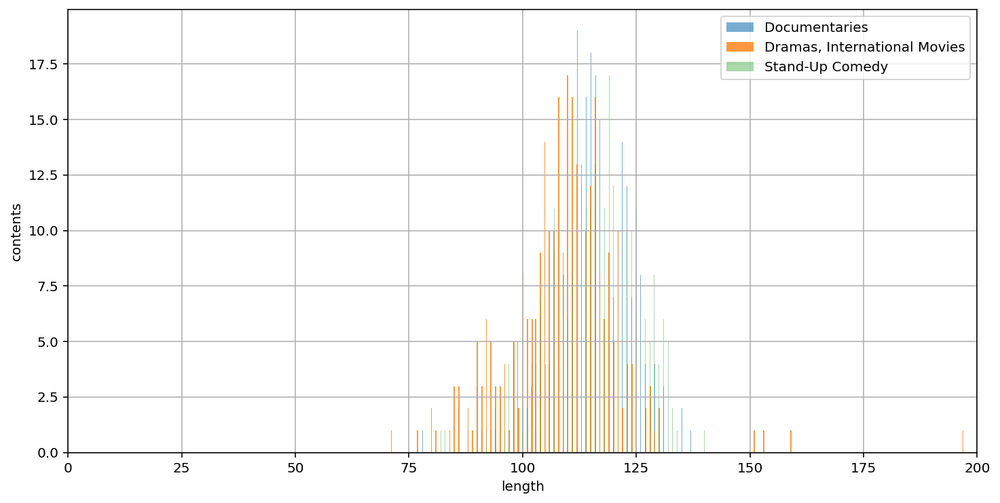

In [81]:
matplotlib.rcParams['figure.figsize'] = (12.0, 6.0)
bins = 500
plt.hist(content_1['length'], alpha = 0.6, bins=bins, label="Documentaries")
plt.hist(content_2['length'], alpha = 0.8, bins=bins, label="Dramas, International Movies")
plt.hist(content_3['length'], alpha = 0.4, bins=bins, label="Stand-Up Comedy")
plt.xlabel('length')
plt.ylabel('contents')
plt.legend()
plt.xlim(0,200)
plt.grid()
plt.show()

##### Which text normalization technique have you used and why?

Answer Here.

#### 9. Part of speech tagging

In [82]:
# POS Taging

#### 10. Text Vectorization

In [83]:
# Vectorizing Text


##### Which text vectorization technique have you used and why?

Answer Here.

### 4. Feature Manipulation & Selection

#### 1. Feature Manipulation

In [84]:
# Manipulate Features to minimize feature correlation and create new features

#### 2. Feature Selection

In [85]:
# Select your features wisely to avoid overfitting

##### What all feature selection methods have you used  and why?

Answer Here.

##### Which all features you found important and why?

Answer Here.

### 5. Data Transformation

#### Do you think that your data needs to be transformed? If yes, which transformation have you used. Explain Why?

In [86]:
# Transform Your data

### 6. Data Scaling

In [87]:
# Scaling your data

##### Which method have you used to scale you data and why?

### 7. Dimesionality Reduction

##### Do you think that dimensionality reduction is needed? Explain Why?

Answer Here.

In [88]:
# DImensionality Reduction (If needed)

##### Which dimensionality reduction technique have you used and why? (If dimensionality reduction done on dataset.)

Answer Here.

### 8. Data Splitting

In [89]:
# Split your data to train and test. Choose Splitting ratio wisely.

##### What data splitting ratio have you used and why? 

Answer Here.

### 9. Handling Imbalanced Dataset

##### Do you think the dataset is imbalanced? Explain Why.

Answer Here.

In [90]:
# Handling Imbalanced Dataset (If needed)

##### What technique did you use to handle the imbalance dataset and why? (If needed to be balanced)

Answer Here.

## ***7. ML Model Implementation***

### ML Model - 1

*k_means clustering* 

In [91]:
# ML Model - 1 Implementation
vectorizer = TfidfVectorizer(stop_words= 'english')

X = vectorizer.fit_transform(df2["description"])
X = X.toarray()
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score
import matplotlib.pyplot as plt
kmeans = KMeans( init="k-means++", n_clusters=8, max_iter=300,   random_state=0)
from yellowbrick.cluster import KElbowVisualizer
# Fit the Algorithm

# Predict on the model

/usr/local/lib/python3.9/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/cluster/_kmeans.py:870: F

KElbowVisualizer(ax=<Axes: >, estimator=KMeans(n_clusters=7, random_state=0),
                 k=(2, 8), metric='silhouette', timings=False)

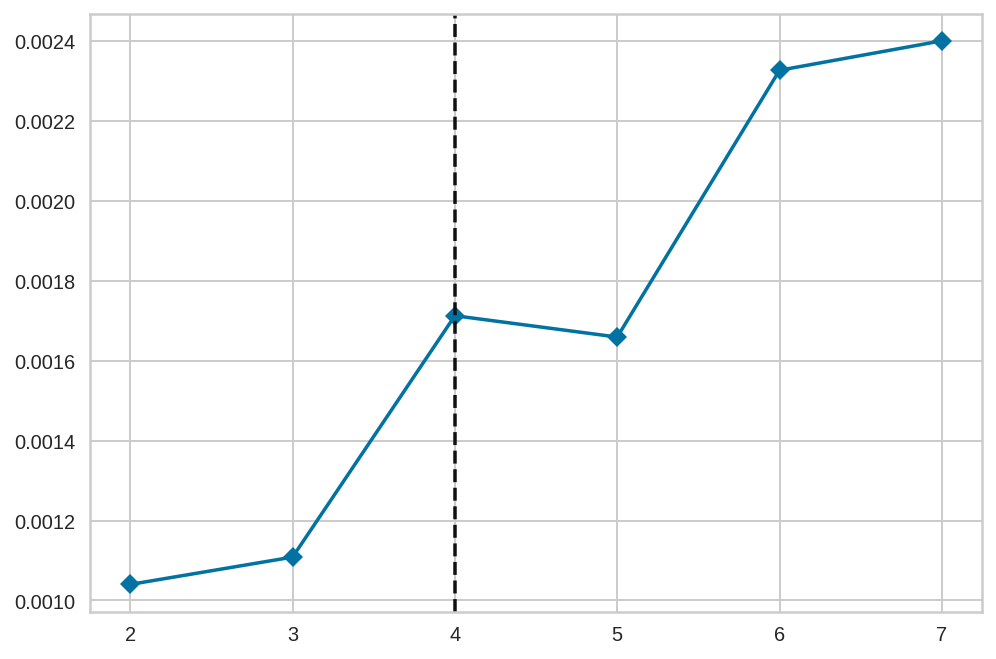

In [92]:
# trying Silhoutte Score
visualizer = KElbowVisualizer(kmeans, k=(2,8), metric='silhouette', timings=False, locate_elbow=True)
visualizer.fit(X)

In [93]:
# looks like we can go with 4 clusters.

kmeans= KMeans(n_clusters=4, init= 'k-means++',max_iter=300, n_init=1)

kmeans.fit(X)

KMeans(n_clusters=4, n_init=1)

In [94]:
#predict the labels of clusters.
labels = kmeans.fit_predict(X)

In [95]:
# Visualizing evaluation Metric Score chart
from sklearn.metrics import silhouette_score
print("Silhouette Coefficient: %0.3f"%silhouette_score(X, kmeans.labels_))

Silhouette Coefficient: 0.001


silhoutte score .001 means overlapping in clustering

### ML Model - 2

**hierarchial clustering**

#### 1. Explain the ML Model used and it's performance using Evaluation metric Score Chart.

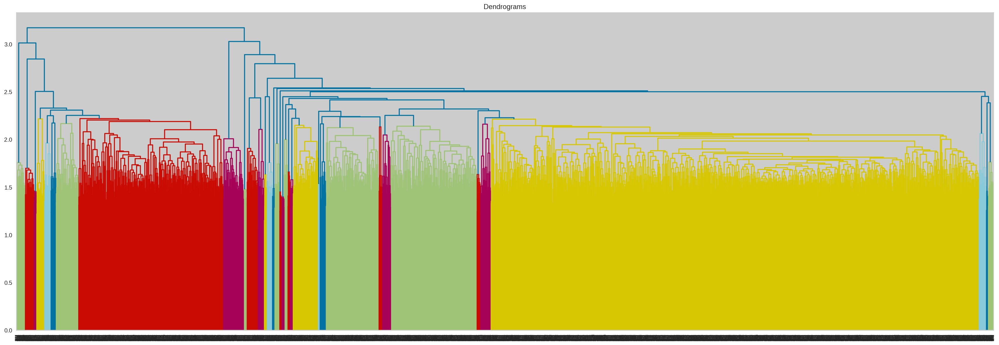

In [97]:
# Visualizing evaluation Metric Score chart
import scipy.cluster.hierarchy as shc
plt.figure(figsize=(30,10))  
plt.title("Dendrograms")  
dend = shc.dendrogram(shc.linkage(X, method='ward'))

plt.axhline(y=180)

let's go with 5 clusters

In [98]:
from sklearn.cluster import AgglomerativeClustering
aggh = AgglomerativeClustering(n_clusters=5, affinity='euclidean', linkage='ward')  
aggh.fit(X)

/usr/local/lib/python3.9/dist-packages/sklearn/cluster/_agglomerative.py:983: FutureWarning: Attribute `affinity` was deprecated in version 1.2 and will be removed in 1.4. Use `metric` instead
  warnings.warn(


AgglomerativeClustering(affinity='euclidean', n_clusters=5)

In [99]:
y_hc=aggh.fit_predict(X)


/usr/local/lib/python3.9/dist-packages/sklearn/cluster/_agglomerative.py:983: FutureWarning: Attribute `affinity` was deprecated in version 1.2 and will be removed in 1.4. Use `metric` instead
  warnings.warn(


In [100]:
print("Silhouette Coefficient: %0.3f"%silhouette_score(X, aggh.labels_, sample_size=1000))

Silhouette Coefficient: -0.004


silhouette score less than 0. so this is bad cluster compare to the k_means clustering

*performing pca*

In [107]:
from sklearn.decomposition import PCA

In [108]:
# function to understand the variance for different n_components
def pca_variance(n_components):
  pca= PCA(n_components= n_components)
  pca.fit(X)
  print(sum(pca.explained_variance_ratio_))

In [112]:
pca_variance(800)

0.4131123244473001


In [113]:
pca_variance(1900)

0.6526979631848888


In [114]:
# components with 95% variance
pca = PCA(n_components=0.95)
pca.fit(X)

PCA(n_components=0.95)

Text(0.5, 1.0, 'No. of components VS Explained variance')

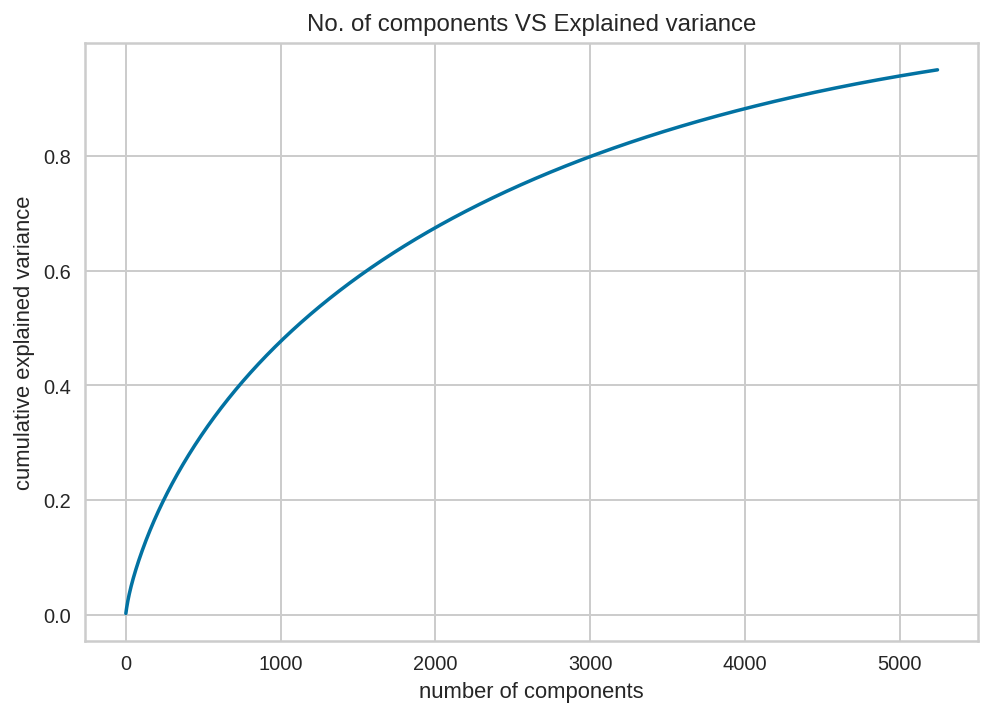

In [115]:
plt.plot(np.cumsum(pca.explained_variance_ratio_))
plt.xlabel('number of components')
plt.ylabel('cumulative explained variance')
plt.title('No. of components VS Explained variance')

In [116]:
X_pca = pca.fit_transform(X)

In [117]:
X_pca.shape

(7274, 5245)

In [118]:
# fitting the k means algorithm on lower features

kmeans= KMeans(n_clusters=7, init= 'k-means++',max_iter=300, n_init=1)
kmeans.fit(X_pca)

KMeans(n_clusters=7, n_init=1)

In [119]:
print("Silhouette Coefficient:  %0.3f"%silhouette_score(X_pca, kmeans.labels_))

Silhouette Coefficient:  0.001


In [120]:
#predict the labels of clusters.
label = kmeans.fit_predict(X_pca)

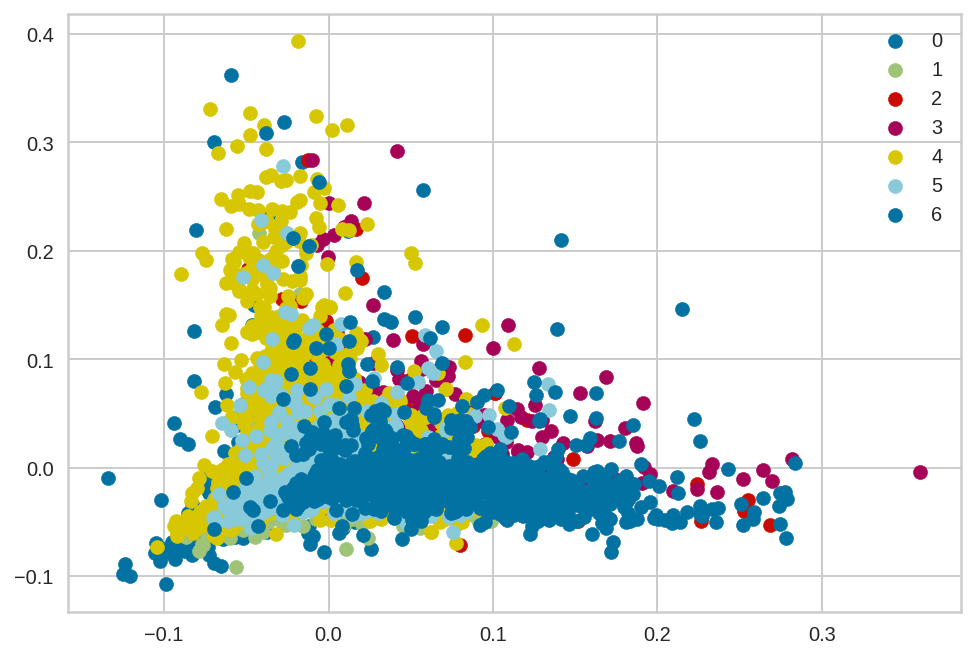

In [121]:
#Getting unique labels
u_labels = np.unique(label)
 
#plotting the results:
for i in u_labels:
    plt.scatter(X_pca[label == i , 0] , X_pca[label == i , 1] , label = i)
plt.legend()
plt.show()

### 1. Which Evaluation metrics did you consider for a positive business impact and why?

in this clustering analysis,k_means clustering method is good for this project,because it has highest silhouette score.

### 2. Which ML model did you choose from the above created models as your final prediction model and why?

k-means clustering is good for final prediction.because it shows more seperated cluster than hierarchial clustering.

## ***8.*** ***Future Work (Optional)***

### 1. Save the best performing ml model in a pickle file or joblib file format for deployment process.


In [105]:
# Save the File

### 2. Again Load the saved model file and try to predict unseen data for a sanity check.


In [106]:
# Load the File and predict unseen data.

### ***Congrats! Your model is successfully created and ready for deployment on a live server for a real user interaction !!!***

# **Conclusion**

1)till 2020,higher number of movies released than tv shows.there very high difference in between total number of movies released and tv shows released
2)when analysing 2011 to 2020,trend has been changed.now net flix give more preference to tv shows rather than movies.in 2020,more number of tv shows released than movies
3)when analysing type tv shows with rating,tv shows with adult content has more preference in netflix
4)when analysing type movie with rating,movies with adult content has more preference,at the same time movies has child content also promoted
5)most number of shows released in united states.followed by india and united kigdom.
6)in unites states,documentaries and standup comedies are most released contents.these contents have more viewers in united states.similary,found the best viewers content in top 10 countries.
7)k_means clustering machine learning method is used for this project.there is some cluster overlapping in this method.but it has highest silhouette score.

### ***THANKS !!!***